In [152]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import statsmodels.api as sm
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram


In [3]:
df = pd.read_parquet('feature.parq')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 604378 entries, 2025-04-16 00:00:05 to 2025-04-22 23:59:59
Data columns (total 87 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   mid_prc     604378 non-null  float32
 1   b66accf4d4  604378 non-null  float32
 2   01d830fc33  604378 non-null  float32
 3   ac29aa28b0  604378 non-null  float32
 4   86eecbe036  604378 non-null  float32
 5   9c51f3cf1d  604378 non-null  float32
 6   706dbe6d28  604378 non-null  float32
 7   cb232e1c9f  604378 non-null  float32
 8   301f8d1b44  604378 non-null  float32
 9   134e1a6937  604378 non-null  float32
 10  5f3f783a1f  604378 non-null  float32
 11  d182b35ca9  604378 non-null  float32
 12  c910253362  604378 non-null  float32
 13  8572904679  604378 non-null  float32
 14  486b27acac  604378 non-null  float32
 15  e10ab80234  604378 non-null  float32
 16  5e7e5a691e  604378 non-null  float32
 17  ec021e3c39  604378 non-null  float32
 18  c12d090869

In [5]:
df.columns[df.min()!=-5]

Index(['mid_prc'], dtype='object')

In [6]:
df.max()

mid_prc       1777.680054
b66accf4d4       5.000000
01d830fc33       5.000000
ac29aa28b0       5.000000
86eecbe036       5.000000
                 ...     
73762306aa       5.000000
1c6e322c2d       5.000000
0d19cb3fb0       5.000000
486cb65b0c       5.000000
c49a5f9c65       5.000000
Length: 87, dtype: float32

In [7]:
df.columns[df.max()!=5]

Index(['mid_prc'], dtype='object')

In [8]:
df.columns[df.dtypes!='float32']

Index([], dtype='object')

In [9]:
og_df = df

In [10]:
df.columns = [df.columns[0]] + [f'f{i}' for i in range(1, len(df.columns))]
df.head()


,mid_prc,f1,f2,f3,f4,f5,f6,f7,f8,f9,...,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86
timestamp,,,,,,,,,,,,,,,,,,,,,
2025-04-16 00:00:05,1588.010010,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.000000,...,5.000000,5.000000,5.000000,5.0,5.000000,5.000000,5.000000,5.0,5.000000,5.0000
2025-04-16 00:00:06,1587.824951,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,0.601331,...,0.023879,-1.795081,5.000000,5.0,-0.614067,-5.000000,5.000000,5.0,-0.774996,-5.0000
2025-04-16 00:00:07,1587.824951,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,0.322740,...,0.766593,5.000000,5.000000,5.0,0.142544,3.931395,5.000000,5.0,-0.024244,-3.6261
2025-04-16 00:00:08,1587.305054,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.000000,...,-5.000000,-5.000000,-4.450434,-5.0,-5.000000,-5.000000,-4.419014,-5.0,-5.000000,-5.0000
2025-04-16 00:00:09,1587.285034,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.0,-5.000000,...,-5.000000,-5.000000,-4.941638,-5.0,-5.000000,-5.000000,-4.966719,-5.0,-5.000000,-5.0000


In [11]:
print(df.index.min())
print(df.index.max())

2025-04-16 00:00:05
2025-04-22 23:59:59


In [12]:
df.describe()


,mid_prc,f1,f2,f3,f4,f5,f6,f7,f8,f9,...,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86
count,604378.000000,604378.000000,604378.000000,604378.000000,604378.000000,604378.000000,604378.000000,604378.000000,604378.000000,604378.000000,...,604378.000000,604378.000000,604378.000000,604378.000000,604378.000000,604378.000000,604378.000000,604378.000000,604378.000000,604378.000000
mean,1601.856689,-0.001573,0.000471,0.000961,0.000961,-0.003787,-0.004580,-0.002970,-0.003124,0.000960,...,0.000102,-0.001177,-0.001475,-0.001235,-0.000627,-0.001408,-0.001800,-0.001257,-0.000812,-0.001446
std,33.198315,1.002511,1.000538,0.999159,0.999160,1.005867,1.007191,1.004049,1.002259,1.061541,...,0.997537,1.001698,0.967030,1.001712,1.002166,1.001653,0.966073,1.001713,1.002266,1.001555
min,1536.010010,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,...,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000
25%,1581.724976,-0.673479,-0.634930,-0.610623,-0.610618,-0.661305,-0.605361,-0.596674,-0.595345,-0.295918,...,-0.523161,-1.018428,-0.643154,-1.028844,-0.588139,-1.011383,-0.636527,-1.028464,-0.621631,-1.004722
50%,1591.655029,-0.007083,-0.004322,0.000993,0.001000,-0.003068,-0.006797,0.000932,0.000944,-0.000310,...,0.009299,0.770835,0.010962,0.779418,0.011513,0.718494,0.008375,0.769727,0.011204,0.690965
75%,1612.604980,0.664406,0.633471,0.612619,0.612619,0.654505,0.595105,0.594139,0.592611,0.303442,...,0.532350,0.960790,0.643316,0.957942,0.592339,0.947430,0.634845,0.954898,0.628167,0.936125
max,1777.680054,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [13]:
d = df.index.to_series().diff()
print(d.max())
print(d.min())
print(len(d[d== pd.Timedelta(seconds=2)]))
print(print((d[d== pd.Timedelta(seconds=3)])))


0 days 00:00:03
0 days 00:00:01
413
timestamp
2025-04-17 00:00:05   0 days 00:00:03
2025-04-22 00:00:04   0 days 00:00:03
Name: timestamp, dtype: timedelta64[ns]
None


There are 413 time stamps with missing right after, and 2 with 2 seconds of data missing

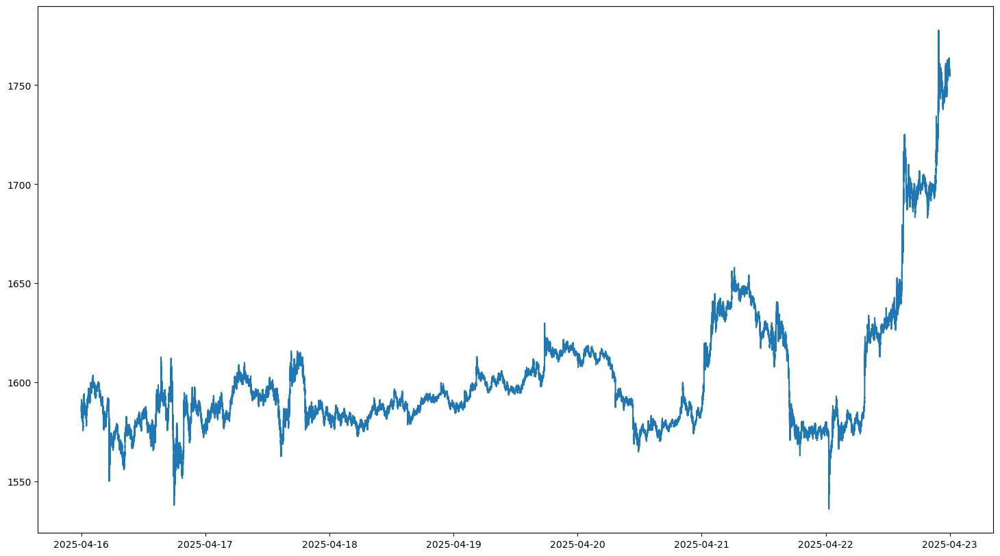

In [14]:
plt.figure(figsize=(18,10))
plt.plot(df['mid_prc'])
plt.show()

In [15]:
print('Lowest on 20th is', df.loc['2025-04-20']['mid_prc'].min())
print('Max on 21st', df.loc['2025-04-21']['mid_prc'].max())
print('Min on 21st', df.loc['2025-04-21']['mid_prc'].min())
print('Max on 22nd', df.loc['2025-04-22']['mid_prc'].max())
print('Min on 22nd', df.loc['2025-04-22']['mid_prc'].min())

Lowest on 20th is 1564.8349609375
Max on 21st 1657.9100341796875
Min on 21st 1562.9749755859375
Max on 22nd 1777.6800537109375
Min on 22nd 1536.010009765625


200 point jump between the 21st and 22nd

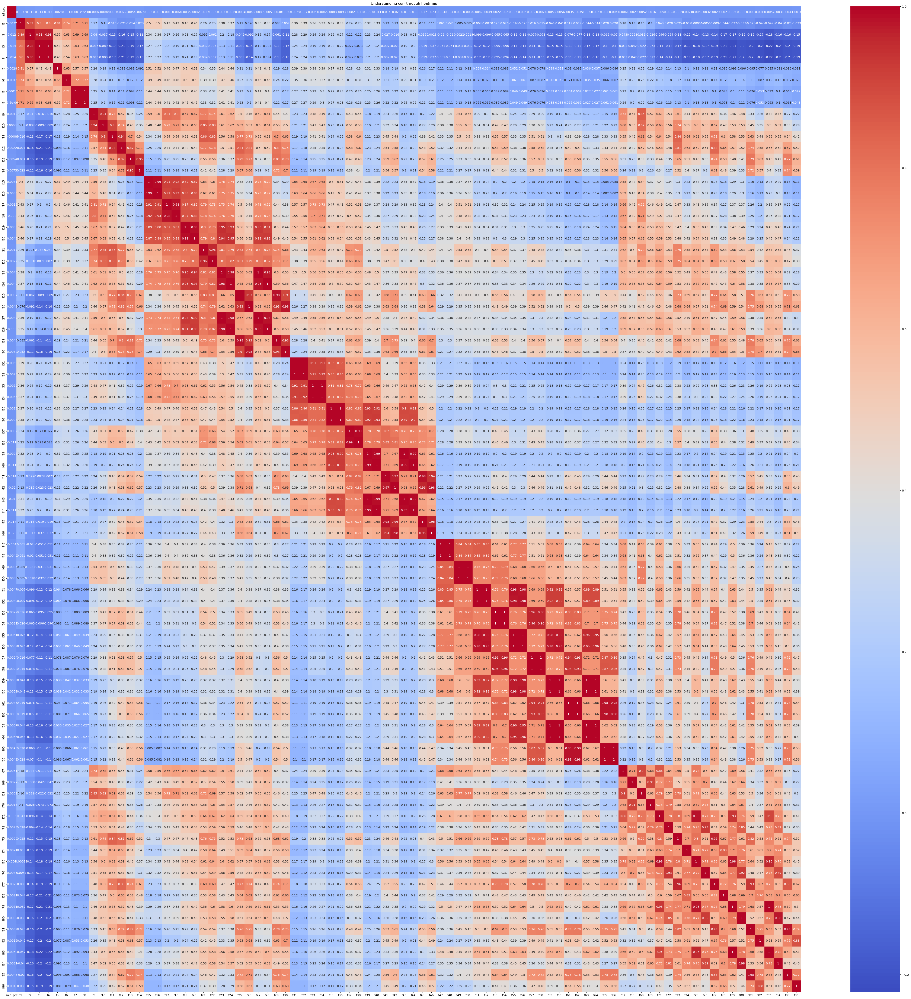

In [16]:
correlation  = df.corr()
plt.figure(figsize=(60,60))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Understanding corr through heatmap')
plt.show()

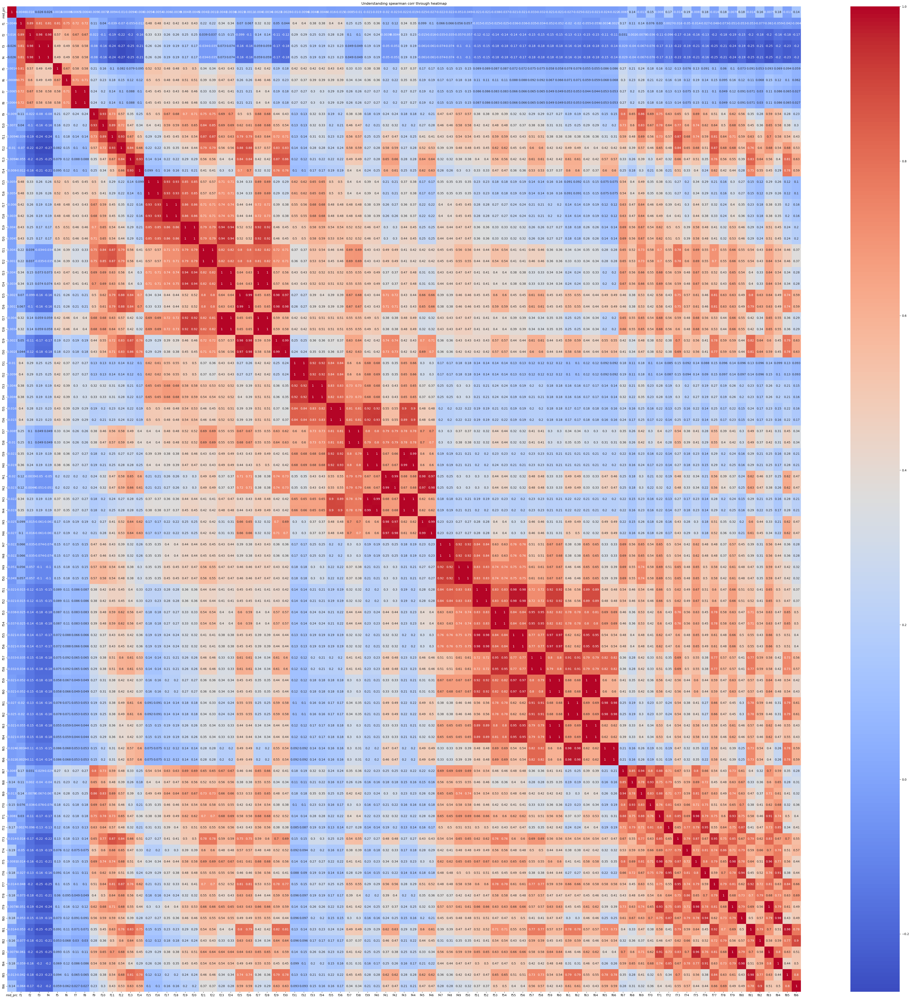

In [17]:
spearman_correlation  = df.corr(method="spearman")
plt.figure(figsize=(60,60))
sns.heatmap(spearman_correlation, annot=True, cmap='coolwarm')
plt.title('Understanding spearman corr through heatmap')
plt.show()

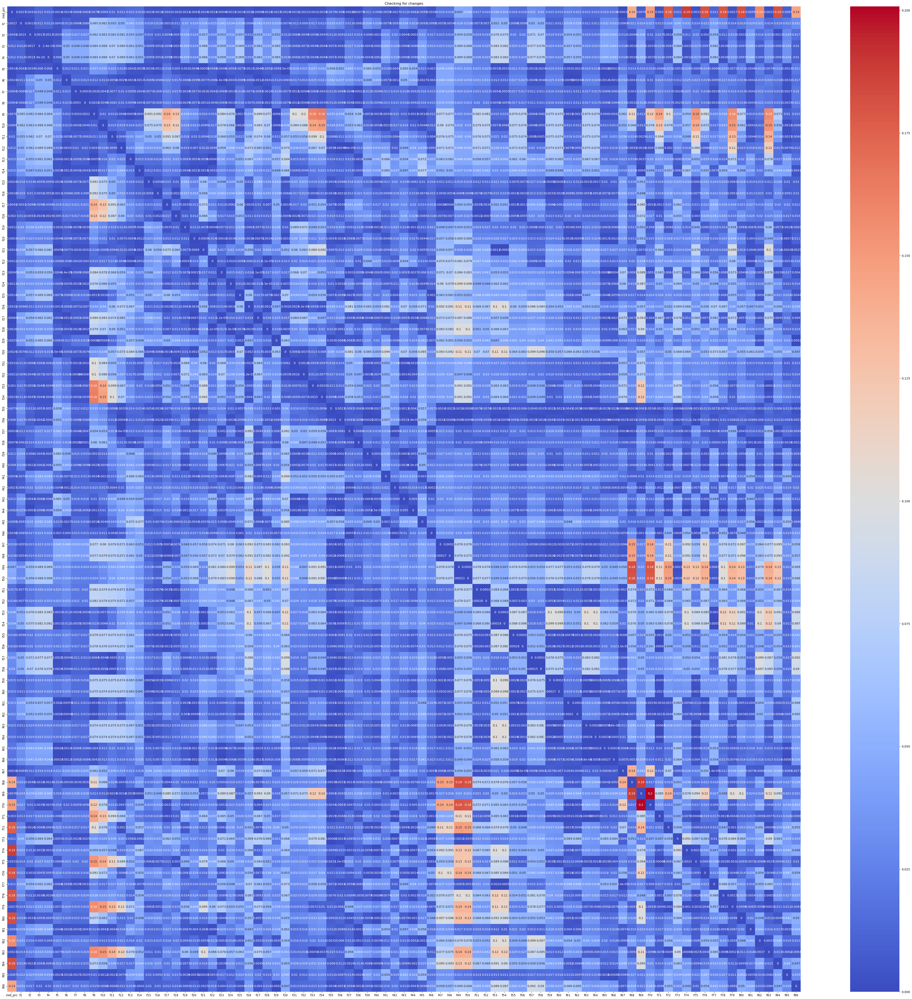

In [18]:
diff_in_corr = abs(spearman_correlation-correlation)
plt.figure(figsize=(60,60))
sns.heatmap(diff_in_corr, annot=True, cmap='coolwarm')
plt.title('Checking for changes')
plt.show()

In the difference between correlation (pearson and spearman), the ones between some standout. particularly, the one price has with 68, 70, 72. 74. 76, 80. 82, 84 and 86. (but don't think it's worth exploring, the value for pearson is insanely small)

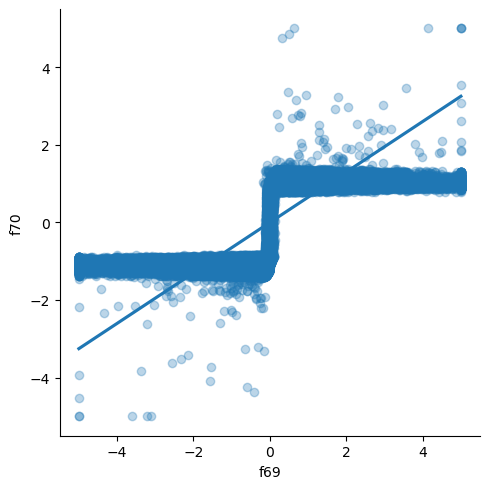

In [19]:
sns.lmplot(x='f69', y='f70', data=df, scatter_kws={'alpha':0.3})

In [20]:
list_of_feature_ranking= dict()
threshold = 0.75
for i in correlation.columns:
    features = correlation[i]
    pass_features = features[(features > threshold)]
    ranked_winners = pass_features.sort_values(ascending=False).index.to_list()
    ranked_winners.remove(i)
    list_of_feature_ranking[i] = ranked_winners



In [21]:
list_of_feature_ranking

{'mid_prc': [],
 'f1': ['f2', 'f5', 'f3', 'f4'],
 'f2': ['f3', 'f4', 'f1'],
 'f3': ['f4', 'f2', 'f1'],
 'f4': ['f3', 'f2', 'f1'],
 'f5': ['f1'],
 'f6': [],
 'f7': ['f8'],
 'f8': ['f7'],
 'f9': ['f10', 'f69', 'f17', 'f18', 'f21'],
 'f10': ['f9', 'f11', 'f21', 'f22', 'f69'],
 'f11': ['f12', 'f10', 'f21', 'f22', 'f73', 'f77', 'f25'],
 'f12': ['f11', 'f13', 'f25', 'f77', 'f73', 'f26', 'f29', 'f22', 'f21', 'f30'],
 'f13': ['f14', 'f12', 'f29', 'f81', 'f25', 'f30', 'f26', 'f85'],
 'f14': ['f13'],
 'f15': ['f16', 'f18', 'f17', 'f19', 'f20', 'f23'],
 'f16': ['f15', 'f18', 'f17', 'f19', 'f20', 'f23'],
 'f17': ['f18', 'f15', 'f16', 'f19', 'f20', 'f9', 'f21', 'f23'],
 'f18': ['f17', 'f16', 'f15', 'f20', 'f19', 'f9', 'f21', 'f24', 'f23', 'f22'],
 'f19': ['f20',
  'f23',
  'f24',
  'f27',
  'f28',
  'f15',
  'f16',
  'f18',
  'f17',
  'f21',
  'f22'],
 'f20': ['f19',
  'f24',
  'f23',
  'f28',
  'f27',
  'f16',
  'f18',
  'f15',
  'f17',
  'f22',
  'f21'],
 'f21': ['f22',
  'f11',
  'f10',
  'f25',

The seems to be chunks of similarly drawn features

In [22]:
feature_df = df.drop('mid_prc', axis=1)
price_df = df['mid_prc']

In [23]:
price_df['returns'] = price_df.pct_change()


In [24]:
fig, axes = plt.subplots(len(feature_df.columns), 1, figsize = (30,feature_df.shape[1]*4))

for i, cols in enumerate(feature_df.columns):
    sns.histplot(feature_df, x = cols, kde = True, ax = axes[i])
    axes[i].set_title(f'Distribution of {cols}')

plt.tight_layout()

In [25]:
r = pd.DataFrame(feature_df.nunique(), columns=['unique_vals'])

In [26]:
r[r['unique_vals']<500000]

,unique_vals


Nothing takes binary or discrete values

In [27]:
skew_val = feature_df.skew().sort_values(ascending=False)
print(f'Max skew is {skew_val.max()}, Min skew is {skew_val.min()}, Mean skew is {skew_val.mean()}, Medians skew is {skew_val.median()}')

Max skew is 0.10753103345632553, Min skew is -0.35348623991012573, Mean skew is -0.03346288576722145, Medians skew is -0.004786526784300804


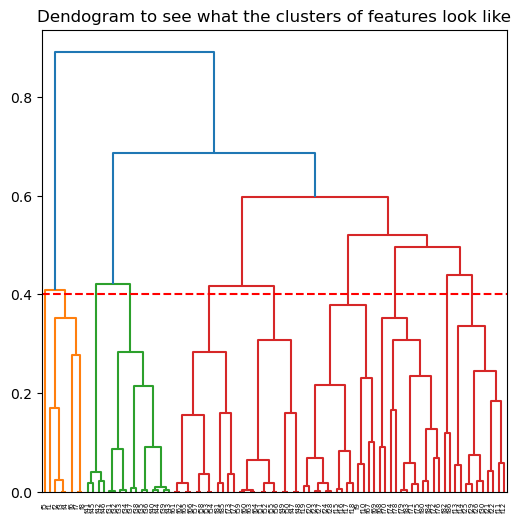

In [140]:
corr_without_price = correlation.drop(columns=['mid_prc'], index=['mid_prc'])
distance_mat = 1 - corr_without_price
Z = linkage(squareform(distance_mat), method='average')
plt.figure(figsize=(6,6))
dendrogram(Z, labels = corr_without_price.index, leaf_rotation=90)
plt.title("Dendogram to see what the clusters of features look like")
plt.axhline(y=0.4, color= 'red', linestyle='--')
plt.show()

In [88]:
t = 0.4
clusters = fcluster(Z, t=t, criterion='distance')
cluster_assignments = pd.DataFrame({
    "feature": corr_without_price.index,
    "cluster": clusters
}).sort_values("cluster")

for clust, rows in cluster_assignments.groupby("cluster"):
    print(f"Cluster {clust}: {sorted(rows['feature'].tolist())}")

Cluster 1: ['f1', 'f2', 'f3', 'f4', 'f6', 'f7', 'f8']
Cluster 2: ['f5']
Cluster 3: ['f41', 'f42', 'f45', 'f46']
Cluster 4: ['f31', 'f32', 'f33', 'f34', 'f35', 'f36', 'f37', 'f38', 'f39', 'f40', 'f43', 'f44']
Cluster 5: ['f53', 'f54', 'f57', 'f58', 'f61', 'f62', 'f65', 'f66', 'f73', 'f77', 'f81', 'f85']
Cluster 6: ['f47', 'f48', 'f49', 'f50', 'f51', 'f52', 'f55', 'f56', 'f59', 'f60', 'f63', 'f64']
Cluster 7: ['f10', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f23', 'f24', 'f27', 'f28', 'f67', 'f69', 'f9']
Cluster 8: ['f68', 'f70', 'f71', 'f72', 'f74', 'f75', 'f76', 'f78', 'f79', 'f80', 'f83', 'f84']
Cluster 9: ['f82', 'f86']
Cluster 10: ['f11', 'f12', 'f13', 'f14', 'f21', 'f22', 'f25', 'f26', 'f29', 'f30']


Don't like this structuring, but I'll keep it. 

Exploring something I noticed - block f15-f30 and f31-46 have eerily similar plots in the heatmap.

In [158]:
block1 = correlation.loc["f15":"f30", "f15":"f30"]
b1_list = block1.values.ravel()
block2 = correlation.loc["f31":"f46", "f31":"f46"]
block3 = correlation.loc["f47":"f66", "f47":"f66"]
block3 = block3.drop(columns=['f53', 'f54', 'f55', 'f56'], index=['f53', 'f54', 'f55', 'f56'])
b3_list = block3.values.ravel()

b2_list= block2.values.ravel()

print(len(b3_list)- len(b2_list))


0


In [159]:
corr_corr12 = pd.Series(b1_list).corr(pd.Series(b2_list))
corr_corr23 = pd.Series(b2_list).corr(pd.Series(b3_list))
corr_corr13 = pd.Series(b1_list).corr(pd.Series(b3_list))
print(corr_corr12)
print(corr_corr23)
print(corr_corr13)


0.974981974464152
0.953523504911623
0.9220302186097322


It's a 0.97 correlation of correlation, something to explore

5.0


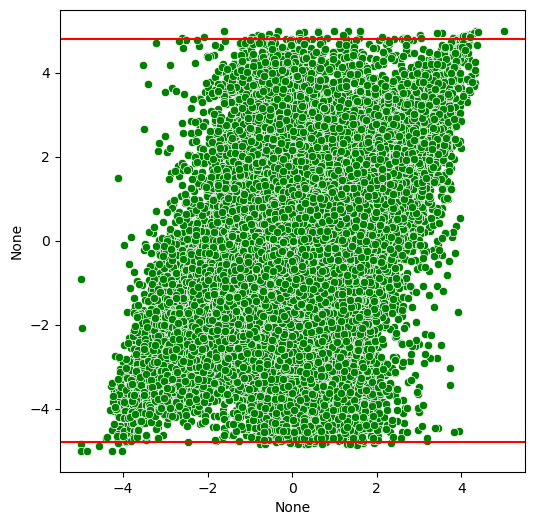

In [ ]:
block1_mean = df.loc[: , "f15" : 'f30'].mean(axis=1)
block2_mean = df.loc[: , "f31": 'f46'].mean(axis=1)
block3_create = df.loc[:, "f31"]
print(max(block2_mean))

plt.figure(figsize=(6,6))
sns.scatterplot(x = block1_mean, y = block2_mean, color='green')
plt.axhline(y=-4.8, color = 'red')
plt.axhline(y=4.8, color = 'red')

plt.show()

In [142]:
print(block2_mean.std())
print(block1_mean.std())
print(block1_mean.corr(block2_mean))

0.8478580713272095
0.8886604905128479
0.6205306225970663


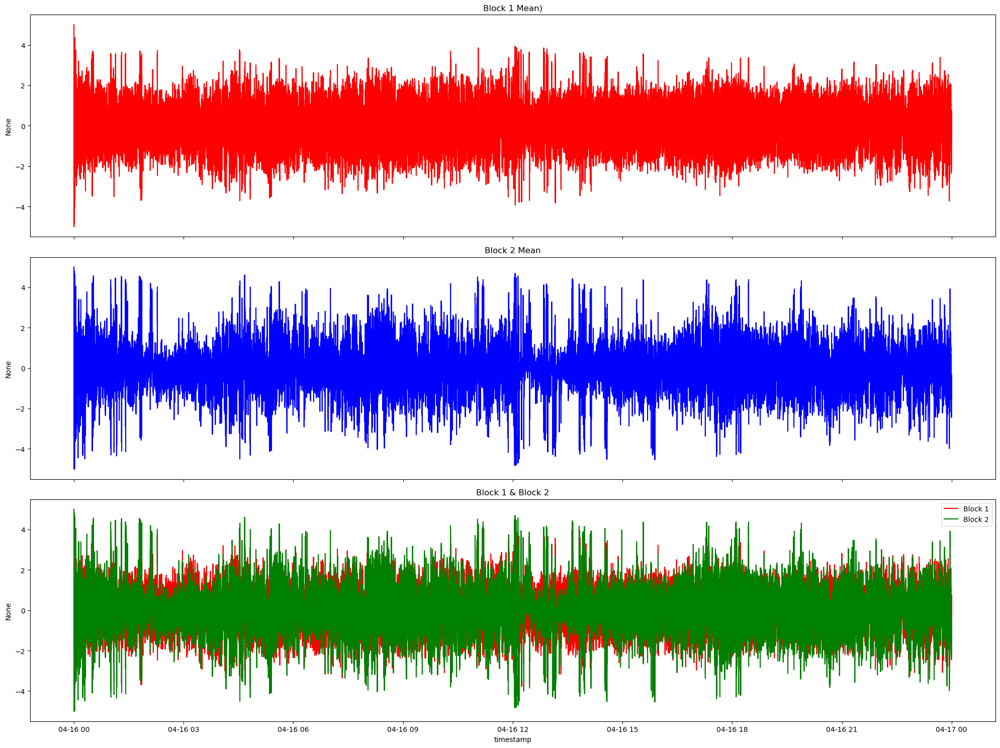

In [137]:
fig, axes = plt.subplots(3, 1, figsize=(20, 15), sharex=True)

sns.lineplot(x=block1_mean.loc['2025-04-16'].index, y=block1_mean.loc['2025-04-16'], ax=axes[0], color="red")
axes[0].set_title("Block 1 Mean)")

sns.lineplot(x=block2_mean.loc['2025-04-16'].index, y=block2_mean.loc['2025-04-16'], ax=axes[1], color="blue")
axes[1].set_title("Block 2 Mean")

sns.lineplot(x=block1_mean.loc['2025-04-16'].index, y=block1_mean.loc['2025-04-16'], ax=axes[2], color="red", label="Block 1")
sns.lineplot(x=block2_mean.loc['2025-04-16'].index, y=block2_mean.loc['2025-04-16'], color="green", label="Block 2")
axes[2].set_title("Block 1 & Block 2")
axes[2].legend()

plt.tight_layout()
plt.show()